<a href="https://colab.research.google.com/github/julcastaneda11-stack/parte-practica-parcial-2-estadistica_1/blob/main/Proyecto_pls.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import io
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
from scipy.stats import shapiro
from scipy.stats import skew, kurtosis
from sklearn.linear_model import LinearRegression

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving nac2022.csv to nac2022.csv


In [ ]:
import pandas as pd
import io
tabla = pd.read_csv(io.BytesIO(uploaded['nac2022.csv']), sep = ",", index_col=0, encoding='latin-1')
tabla.head(4)

/tmp/ipython-input-1421322044.py:3: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  tabla = pd.read_csv(io.BytesIO(uploaded['nac2022.csv']), sep = ",", index_col=0, encoding='latin-1')


,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION,TIPOFORMULARIO
COD_DPTO,,,,,,,,,,,,,,,,,,,,,
8,638,1,1,NaN,1,4,4,2022,12,1,...,2,12/10/2015,2,2,2.0,29,3,8,1.0,1
11,1,1,1,NaN,1,6,5,2022,12,1,...,2,12/09/2012,2,1,1.0,24,4,11,1.0,1
27,1,1,1,NaN,2,6,5,2022,12,1,...,4,14/03/2019,4,2,2.0,25,3,9,1.0,1
8,1,1,1,NaN,1,7,5,2022,12,1,...,2,21/09/2017,4,1,1.0,29,8,2,1.0,1


In [ ]:
df = tabla[["EDAD_PADRE","EDAD_MADRE","N_HIJOSV"]]
df.head(4)

,EDAD_PADRE,EDAD_MADRE,N_HIJOSV
COD_DPTO,,,
8,29,3,2
11,24,5,2
27,25,3,4
8,29,4,2


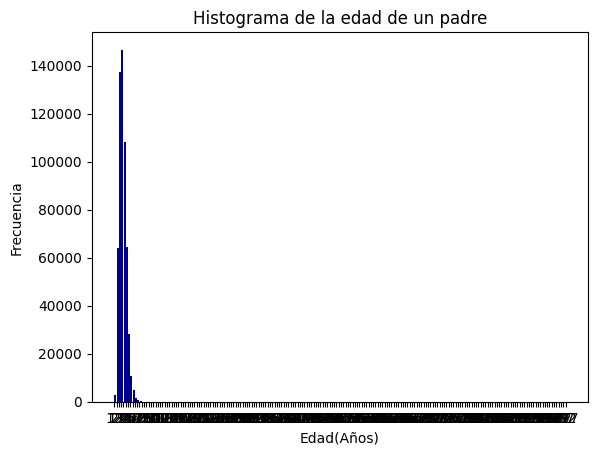

In [ ]:
import matplotlib.pyplot as plt
intervalos = range(min(df.EDAD_PADRE),max(df.EDAD_PADRE)+ 1,5)
plt.hist(df.EDAD_PADRE, bins=intervalos, color='darkblue', rwidth=0.85)
plt.title('Histograma de la edad de un padre')
plt.xlabel('Edad(Años)')
plt.ylabel('Frecuencia')
plt.xticks(intervalos)
plt.show()

In [ ]:
df1= df[(df.EDAD_PADRE < 120) & (df.EDAD_MADRE !=99) & (df.N_HIJOSV !=99)]
df1.head(5)

,EDAD_PADRE,EDAD_MADRE,N_HIJOSV
COD_DPTO,,,
8,29,3,2
11,24,5,2
27,25,3,4
8,29,4,2
76,21,3,1


/tmp/ipython-input-1755947406.py:13: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', linewidth=2, label= 'Distribucion normal', color='darkblue')


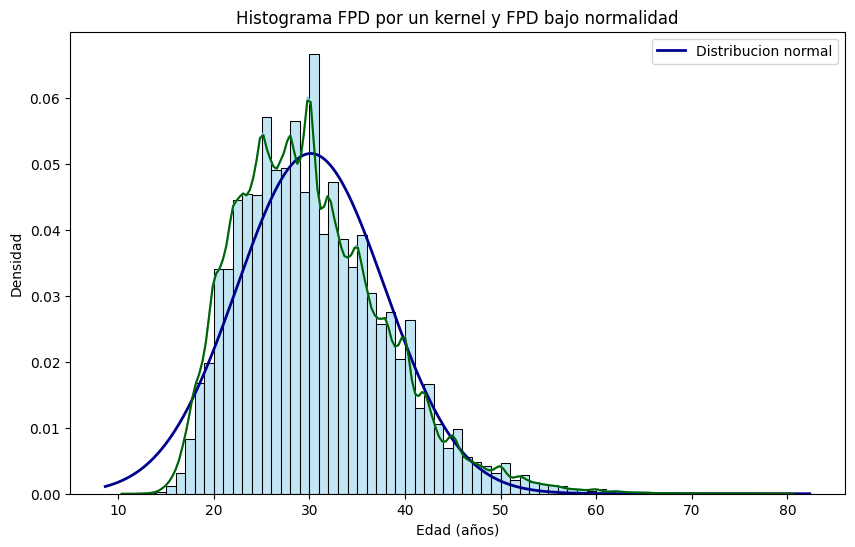

In [ ]:
import seaborn as sns
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
intervalos1 = range(min(df1.EDAD_PADRE),max(df1.EDAD_PADRE)+ 1)
plt.figure(figsize=(10,6))
sns.histplot(x=df1.EDAD_PADRE, bins =intervalos1, kde=True, stat='density', color='skyblue', edgecolor='black')

xmin, xmax = plt.xlim()
x= np.linspace(xmin, xmax, 1000)
p=norm.pdf(x,np.mean(df1.EDAD_PADRE),np.std(df1.EDAD_PADRE))

plt.plot(x, p, 'k', linewidth=2, label= 'Distribucion normal', color='darkblue')
sns.kdeplot(x=df1.EDAD_PADRE, color='darkgreen')

plt.title('Histograma FPD por un kernel y FPD bajo normalidad')
plt.xlabel('Edad (años)')
plt.ylabel('Densidad')
plt.legend()

#Mostrar el grafico
plt.show()

Sea  x:  Edad de un padre de un recien nacido hecho en Colombia.

Descriptivamente como la funcion de probabilidad de los datos estimada por un metodo kernel (linea cyan) no coincide con la funcion de densidad de probabiliad bajo normalidad (lineaa azul) ( x:  edad del padre de un recien naciado ) x- normal(media=x, varianza=si2), entonces no asumimos dormalidad.

In [ ]:
from scipy.stats import shapiro
shapiro(df1.EDAD_PADRE)

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 568276.
  res = hypotest_fun_out(*samples, **kwds)


ShapiroResult(statistic=np.float64(0.9627148118717348), pvalue=np.float64(1.919587188982723e-116))

*Si el valor de p en una prueba de hipotesis es menor que 0.5 se rechaza la hipotesis nula con una confianza del 95%

*Si el valor de p en una prueba de hipotesis es mayor que 0.5 no se rechaza la hipotesis nula con una confianza del 95%.

en nuestro caso particular tenemos que pvalue=0.0 < 0.05 , es decir se rechazaque la variable aleatoria de le edad de un padre de un recien nacido x presenta distribucion normal.

In [ ]:
df1.EDAD_PADRE.count()
len(df1.EDAD_PADRE)

568276

In [ ]:
idx=np.random.randint(len(df1.EDAD_PADRE),size = 100)
shapiro(df1.EDAD_PADRE.index[idx])

ShapiroResult(statistic=np.float64(0.8329486049085262), pvalue=np.float64(2.919985212822623e-09))

Como el valor p (igual a 3.732027 es menor que 0.05 entonces se rechaza que la variable aleatoria de la edad de un padre de un recien nacido en Colombia presenta distribucion normal.

<Axes: ylabel='EDAD_PADRE'>

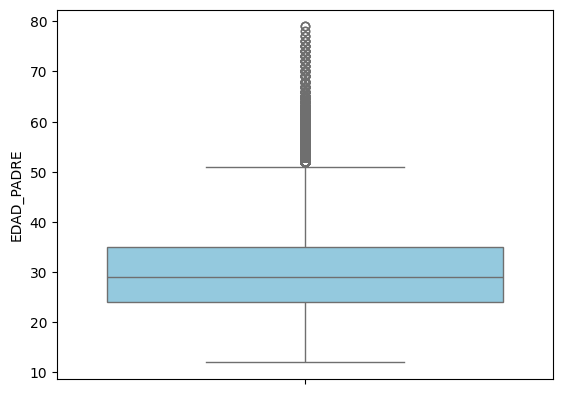

In [ ]:
sns.boxplot(df1.EDAD_PADRE, color='skyblue', saturation=0.75)

Se considera que la edad de un padre de un recien nacido en Colombia es atipica si es mayor que 50 años. El primer cuartil es aproximadamente 25 años, la media aritmetica es aproximadamente 29 años y el tercer cuartil es aproximadamente 35 años.

Rango intercuartilico = tercer cuartil - primer cuartil = 35-25 =10.

In [ ]:
import plotly.express as px
plt.figure(figsize=(5,5))
fig = px.strip(df1.EDAD_PADRE, orientation = 'h')
fig.show()


<Figure size 500x500 with 0 Axes>

De acuerdo con el diagrama de puntos se observa una alta variabilidad de la edad de un padre de un recien nacido en Colombia

In [ ]:
Print(f"Media: {np.mean(df1.EDAD_PADRE)}")

NameError: name 'Print' is not defined

In [ ]:
print(f"varianza: {np.var(df1.EDAD_PADRE)} y la desviacion estandar es de {np.std(df1.EDAD_PADRE)}")

In [ ]:
print(f"Asimetria: {skew(df1.EDAD_PADRE)}")

In [ ]:
print(f"Curtosis: {kurtosis(df1.EDAD_PADRE)}")

Aproximadamente le promedio de la edad de un padre de un recien nacido en Colombia es de 30.14.

Aproximadamente la distancia entre los valores de la edad de un padre de un recien nacido en Colombia y la media es de 7.74

La distribucion de la edad de un padre de un recien nacido en colombia es decir, la media es mayor que la moda de la variable aleatoria.

La distribucion es platicurtica, es decir, hay una baja concentracion de las edades de un padre de un recien nacido en Colombia con respecto a la media


[ ]

Empieza a programar o a crear código con IA.
Productos de pago de Colab - Cancelar contratos


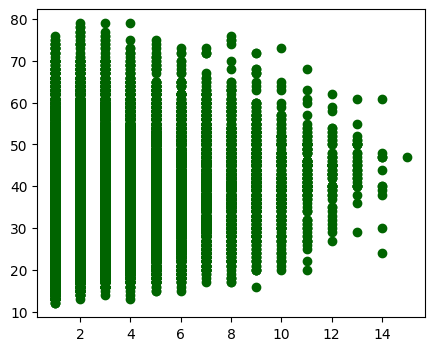

In [ ]:
plt.figure(figsize=(5,4))
plt.scatter(df1["N_HIJOSV"], df1 ["EDAD_PADRE"], color= "darkgreen", marker = "o")
plt.show()

Se observa en el diagrama de deispersion una nube de puntos sin un patron particular, esto quiere decir que las variables son independientes o no estan correlacionadas. Para nuestro ejemplo quiere decir  que el numero de hijos y la edad de un padre en colombia no estan correlacionadas. No hay correlacion entre las variables.

In [ ]:
modelo= LinearRegression()
modelo.fit(np.array(df1.N_HIJOSV).reshape(-1,1),np.array(df1["EDAD_PADRE"]).reshape(-1,1))
predi_lineal=modelo.predict(np.array(df1.N_HIJOSV).reshape(-1,1))
predi_lineal

array([[30.29315726],
       [30.29315726],
       [34.62354964],
       ...,
       [30.29315726],
       [32.45835345],
       [30.29315726]])